In [1]:
import soundfile as sf
import os
import numpy as np
import pandas as pd
from scipy import fftpack, signal
import matplotlib.pyplot as plt
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go
from scipy.signal import butter, lfilter, freqz
from matplotlib import pyplot as plt
from collections import OrderedDict
init_notebook_mode()

%matplotlib inline

### How to read in and process the data ### 

** The dat is in .WAV format. Going to use the sorundfile module to read in data **

1. Each file within a folder represents wave/data heartbeats within a category defined by dataset
    * User provided
        * Normal
        * Heart conditions:
    * Hospital recorded
        * Normal
        * Heart condition
2. We want to take a look at what the signals look like and how to perfrom data process 
    * How to handle N/A
    * How long each file is 
    * How to perform low-pass filtering

** Create a class that generates a series of helper functions for analyzing the data **

In [2]:
def smooth(x,window_len=11,window='hanning'):
    # taken from: http://scipy-cookbook.readthedocs.io/items/SignalSmooth.html
    """smooth the data using a window with requested size.
    
    This method is based on the convolution of a scaled window with the signal.
    The signal is prepared by introducing reflected copies of the signal 
    (with the window size) in both ends so that transient parts are minimized
    in the begining and end part of the output signal.
    
    input:
        x: the input signal 
        window_len: the dimension of the smoothing window; should be an odd integer
        window: the type of window from 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'
            flat window will produce a moving average smoothing.

    output:
        the smoothed signal
        
    example:

    t=linspace(-2,2,0.1)
    x=sin(t)+randn(len(t))*0.1
    y=smooth(x)
    
    see also: 
    
    numpy.hanning, numpy.hamming, numpy.bartlett, numpy.blackman, numpy.convolve
    scipy.signal.lfilter
 
    TODO: the window parameter could be the window itself if an array instead of a string
    NOTE: length(output) != length(input), to correct this: return y[(window_len/2-1):-(window_len/2)] instead of just y.
    """

    if x.ndim != 1:
        raise ValueError, "smooth only accepts 1 dimension arrays."

    if x.size < window_len:
        raise ValueError, "Input vector needs to be bigger than window size."


    if window_len<3:
        return x


    if not window in ['flat', 'hanning', 'hamming', 'bartlett', 'blackman']:
        raise ValueError, "Window is on of 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'"


    s=np.r_[x[window_len-1:0:-1],x,x[-1:-window_len:-1]]
    #print(len(s))
    if window == 'flat': #moving average
        w=np.ones(window_len,'d')
    else:
        w=eval('np.'+window+'(window_len)')

    y=np.convolve(w/w.sum(),s,mode='valid')
    return y




In [3]:
def filter_noise_old(signal, cutoff, samplerate):
    # print(len(signal))
    signal = signal[~np.isnan(signal)]
    # print(len(signal))
    X_fft = fftpack.fft(signal)
    freqs = fftpack.fftfreq(len(X_fft)) * samplerate
    X_fft[abs(freqs) > cutoff] = 0      
    # print(len(np.real(fftpack.ifft(X_fft)) ))
    return np.real(fftpack.ifft(X_fft))     

#   creating-lowpass-filter-in-scipy-understanding-methods-and-units
# Taken from  https://stackoverflow.com/questions/25191620/
def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y


def filter_noise(signal, cutoff, samplerate, order=5):    
    # Filter the data, and plot both the original and filtered signals.
    return butter_lowpass_filter(signal, cutoff, samplerate, order)

    
def plot_data(signal, samplerate):
    return go.Scattergl(
        x=signal.dropna().index,
        y=signal.dropna().values
    )

def plot_fft(signal, samplerate):
    X_fft_no_pad = fftpack.fft(signal.dropna())
    # extract the frequencies from the FFT signal (scale frequencies by their sampling rate)
    freqs = fftpack.fftfreq(len(X_fft_no_pad)) * samplerate
    return go.Scattergl(x=freqs, y=np.abs(X_fft_no_pad))
    
    
class heart_signal(object):
    """
    Create a class to store groups of .wav files 
    We can store statistics on the groups (such as file lengths and N/A)
    We can convert data into a dataframe and perform lowpass filtering
    """    
    
    def __init__(self, folder_path=None, files=None, autoread_files=False):
        """
        when initialized just store the location of all the data files containing .wav files to read in
        """
        self.provided_files = []
        self.autoread_files = autoread_files
        if not(folder_path is None):
            for r, dlist, flist in os.walk(path):
                """
                read in all files provided by folder
                """
                for f in flist:
                    if not(f.endswith('.wav')):
                        continue
                    name = os.path.join(r, f)
                    self.provided_files.append(name)
        if not (files is None):
            for name in files:                
                if os.path.isfile(name) and name.endswith('.wav'):
                    self.provided_files.append(name)
                else:
                    print('Invalid file {0}'.format(name))
        
        if len(self.provided_files) == 0:
            raise Exception
        
        if self.autoread_files:
            self.create_df()
        else:
            self.signal_df = None
        
        self.nan_free = None
        self.s1 = None
        self.s2 = None
                
    
    def create_df(self):
        """
            Read the .wav data into a dataframe where we collect the signal/sound data at the provided sampling rate
        """
        _, self.samplerate = sf.read(self.provided_files[0])
        
        signal_array = []
        data = []
        for name in self.provided_files:            
            signal, samplerate = sf.read(name)
            signal_array.append(list(signal))
            data.append({'name': name, 'basename': os.path.basename(name), 'samplerate': samplerate})
        
        self.data_df = pd.DataFrame(data)
        self.signal_df = pd.DataFrame(signal_array, index=self.data_df['basename'])
        
        if len(self.data_df['samplerate'].unique()) != 1:
            print('The sample rate seems to be different for the provided files!')
        else:
            # we can actually assign "time data" to the columns of the dataframe
            # the "time" will be given in intervals defined by the sampling rate
            time_values = np.arange(0, (self.signal_df.shape[1]*1.0)/self.samplerate, self.samplerate)
            # self.signal_df.rename(columns=lambda x: (1.0 * x)/self.samplerate, inplace=True)
            
        self.filtered_signal_df = self.signal_df
            
    def get_signal_length_distribution(self, nbins=None):
        if self.signal_df is None:
            print('You must create_df() first!')
            return
        
        if nbins:
            return np.histogram(
                self.signal_df.apply(lambda x: len(x.dropna())/self.samplerate, axis=1)
            )
        else:
            return np.histogram(self.signal_df.apply(lambda x: len(x.dropna()), axis=1))
        
    def identify_null_values(self):
        """
        It makes sense for the data to have NaN at the end of the signal. This is because each .wav file is a different 
        length. But not sure if there is any NaN data in the middle of the file. So this makes sure there is only
        one spoint in the data that has Nan values (i.e. doesnt do 0 NaN 1 Nan 2 Nan Nan; but it can do 0 1 2 NaN NaN NaN)
        """
        check_for_nan = (normal_group.signal_df.isnull().diff(axis=1).iloc[:, 1:] == True).sum(axis=1)
        has_unusual_data = check_for_nan[check_for_nan>1]
        if has_unusual_data.shape[0] > 0:            
            self.nan_free = False
            print('WE found files with NaN in them')
        else:
            self.nan_free = True
            print('Files look good (no NaN in the middle)')
        return has_unusual_data.index
        
    def get_some_data(self, index, use_iloc=False):
        """
        return a copy of the signals
        """
        if use_iloc:            
            return self.signal_df.iloc[index].copy()
        else:            
            return self.signal_df.loc[index].copy()
        
    
    def pad_zero(self, check_nan_free = True):
        if check_nan_free and (self.nan_free is None or check_nan_free is False):
            print('Sorry I cannot do this function until I know all nan values have been handled correctly!')
            raise Exception
            return
            
        if self.nan_free is None:
            print("Warning: Im replacing all NaN points in the table with zeros but I havent checked if there are any Nan values in the middle of the dataset...this could screw up the results")
        elif self.nan_free is False:
            print('Warning: Im replacing all Nan points in the table with zeros but some datapoints with Nan are not at the end of the signal and might yield incorrect results')
        
        self.signal_df.fillna(0, inplace=True)
        
    def low_pass_filter(self, freq, limit=None, inplace=False):
        """
        Applies a low pass filter to the signal dataframe
        
        freq: low-pass filter cutoff
        
        returns:
            df (signal df)
        """
        if limit:
            subsample = self.signal_df.iloc[:limit]
        else:
            subsample = self.signal_df
                                           
        new_data = [filter_noise(d, freq, self.samplerate) for d in subsample.values]
    
        new_data_df = pd.DataFrame(new_data, index=subsample.index)
        time_values = np.arange(0, (new_data_df.shape[1]*1.0)/self.samplerate, self.samplerate)
        # new_data_df.rename(columns=lambda x: (1.0 * x)/self.samplerate, inplace=True)
        
        if inplace:            
            self.filtered_signal_df = new_data_df
        else:
            return new_data_df
            
    def heart_beat_rate_to_hz(self, rate_per_min=60):
        # rate_per_min = total (lub/dub) beats per minute
        beats_per_sec = (rate_per_min*1.0)/60
        return beats_per_sec
    
    def heart_beat_rate_to_sampling_rate(self, rate_per_min=60):
        """
        Given a heart beat rate, return the number of "frames" in 
        the wav file that captures a single beat within a window size
        """
        # rate_per_min = total (lub/dub) beats per minute
        beat_hz = self.heart_beat_rate_to_hz(rate_per_min)
        # samplerate => frames/second
        # beat_hz => beats/secon, inverse = seconds/beats
        # frames_per_heartbeat = (frames/second) * (second/beats) = frames/second
        frames_per_heartbeat = self.samplerate*(1/beat_hz)
        return frames_per_heartbeat
    
    def spectrogram(self, window_size, noverlap=None, additional_kwargs={}, 
        limit=None, randomly_select=None, keep_time_unit=False,
        use_filtered_data = True):
        
        random_signals = self.filtered_signal_df if use_filtered_data else self.signal_df
        
        if randomly_select:
            random_signals.subsample(randomly_select)        
            
        if limit:
            limit = min(limit, random_signals.shape[0])
            random_signals = random_signals.iloc[:limit]
        
        freqs_sampled, average_time_window, Sxx = signal.spectrogram(
            random_signals.values, self.samplerate, 
            nperseg=int(window_size), 
            noverlap=int(noverlap), 
            **additional_kwargs
        )
        
        if keep_time_unit is False:
            average_time_window *= np.round(self.samplerate)
        
        return freqs_sampled, average_time_window, \
                pd.Panel(Sxx, items=random_signals.index, major_axis=freqs_sampled, minor_axis=average_time_window)
    
    def return_S1_S2_position(self, heart_calls_df, inplace=True):
        """
            Given the dataframe where the S1/S2 or lub/dub demarcations have been called out already, 
            return the original data where 'S1' is filled in the proper index and 'S2' is filled in the proper indexes            
        """
        
        # isolate only the rows listed in heart_calls_df
        subset = self.signal_df.loc[normal_group.signal_df.index.intersection(heart_calls_df.index)]
        # make a dummy dataframe to store results
        result_calls = pd.DataFrame(np.nan, index=subset.index, columns=subset.columns)
        df = heart_calls_df.loc[self.signal_df.index.intersection(heart_calls_df.index)]
        
        # isolate the 'S1' columns from the test set (lub)
        s1_columns = [s for s in df.columns if s.startswith('S1')]
        
        # isolate the 'S2' columns from the test set (dub)
        s2_columns = [s for s in df.columns if s.startswith('S2')]
        
        # really slow and hacky code, but go through each row and find the frames that refer to S1 or S2
        # LABEL THAT ROW/COLUMN COMBINATION in the dummy dataframe
        for i, (r, v) in enumerate(df.iterrows()):
            s1_col = v[s1_columns].dropna().values
            result_calls.ix[i, s1_col] = 'S1'
            s2_col = v[s2_columns].dropna().values
            result_calls.ix[i, s2_col] = 'S2'
            
        if inplace:
            self.S1_S2_demarcation = result_calls
        else:
            return result_calls
    
    def bin_signal(self, nperseg, noverlap, fs=1.0):
        """
            given a window, return the indicies of the dataframe where data should be binned into it            
        """
        col_as_array = self.signal_df.columns
        skip = int(nperseg)
        overlap=int(noverlap)
        bins = OrderedDict()
        for c in np.arange(
            0,
            col_as_array.max(),
            skip - overlap
        ):
            p1 = c
            p2 = (c + skip)
            bins[(c + (skip)/2.0)/fs] = list(col_as_array[p1:p2])
        return bins
    
    def get_average_signal_in_bin(self, nperseg, noverlap, fs=1.0, method='mean'):
        binned_data = self.bin_signal(nperseg, noverlap, fs)
        x_vals = np.array(binned_data.keys())
        new_df = {}
        for k, val in binned_data.iteritems():
            if method == 'mean':
                new_df[k] = self.filtered_signal_df[val].mean(axis=1)
            elif method == 'max':
                # returns either the maximum or minimum value in a group
                new_df[k] = self.filtered_signal_df[val].apply(
                    lambda x: x[np.abs(x.dropna()).idxmax()] if len(x.dropna())>0 else np.nan,
                    axis=1,
                )  
                
            else:
                print('performing median')
                new_df[k] = self.filtered_signal_df[val].median(axis=1)
        return pd.DataFrame(new_df)
    
    def return_s1_s2_binned_data(self, s1_s2_df, nperseg, noverlap, fs=1.0):
        binned_data = self.bin_signal(nperseg, noverlap, fs)
        s1_s2_bins = self.return_S1_S2_position(s1_s2_df, inplace=False)
        
        new_df = {}
        for k, val in binned_data.iteritems():
            new_df[k] = s1_s2_bins[val].apply(
                lambda x: np.array(','.join(sorted(list(x.dropna().unique())))) if len(x.dropna()) > 0 else '',
                axis=1
            )
        return pd.DataFrame(new_df)

** Step 1) Read in normal heartbeat data (From the set_a) folder **

In [4]:
# define location
# path = './set_a'
df = pd.read_csv(
    './set_a/Atraining_normal_seg.csv', 
    index_col=0
)# .applymap(lambda x: (x*1.0)/normal_group.samplerate)

files = list(df.index.map(lambda x: os.path.join('./set_a/', 'normal', 'normal__'+'.'.join(x.split('.')[:-1]) + '.wav')))
# create instance
normal_group = heart_signal(files=files)
# read in wav data
normal_group.create_df()
# make sure there are no nan values before the end
# because this is empty there are no null values in the middle of the wav files
normal_group.identify_null_values()


Files look good (no NaN in the middle)


Index([], dtype='object', name=u'basename')

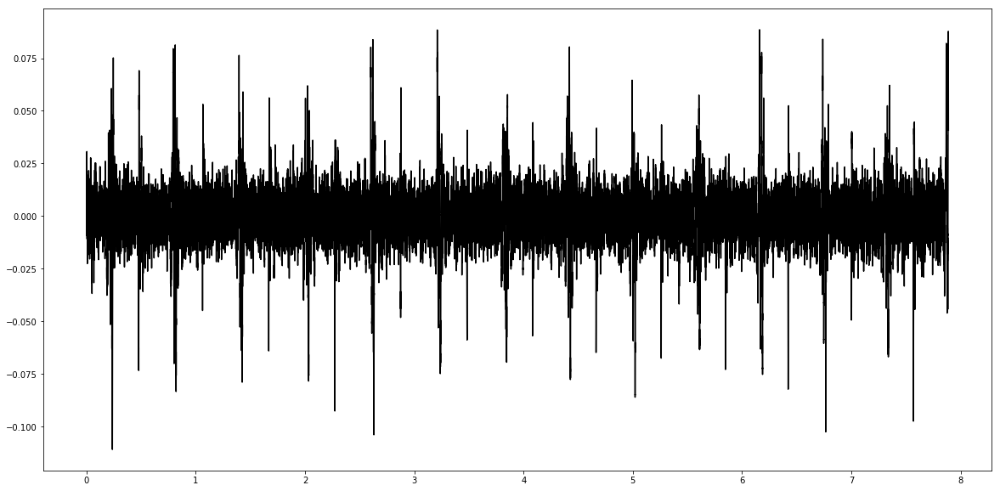

In [5]:
plt.figure(figsize=(20,10))
test = normal_group.signal_df.iloc[0]
plt.plot(test.dropna().index/(1.0*normal_group.samplerate), test.dropna().values, 'k')

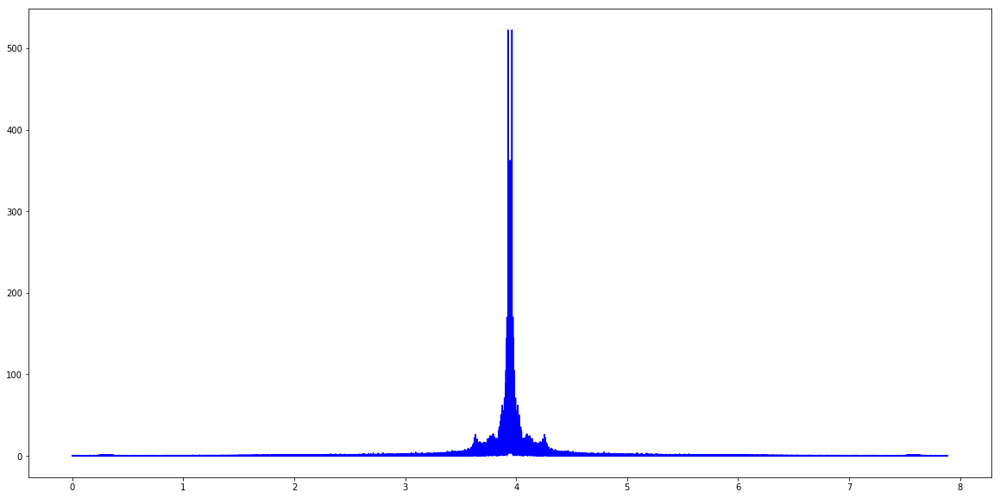

In [9]:
plt.figure(figsize=(20,10))
test = normal_group.signal_df.iloc[0]
plt.plot(test.dropna().index/(1.0*normal_group.samplerate), np.abs(
    fftpack.fftshift(fftpack.fft(test.dropna().values))), 'b')

** Step 2: Filter out noisy data **

In [11]:
normal_group.low_pass_filter(100, inplace=True)

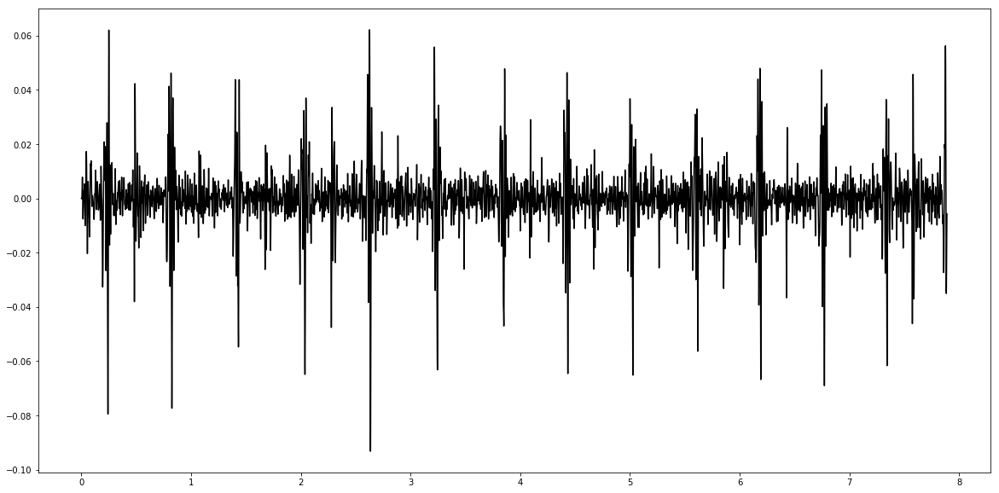

In [12]:
plt.figure(figsize=(20,10))
test = normal_group.filtered_signal_df.iloc[0]
plt.plot(test.dropna().index/(1.0*normal_group.samplerate), test.dropna().values, 'k')

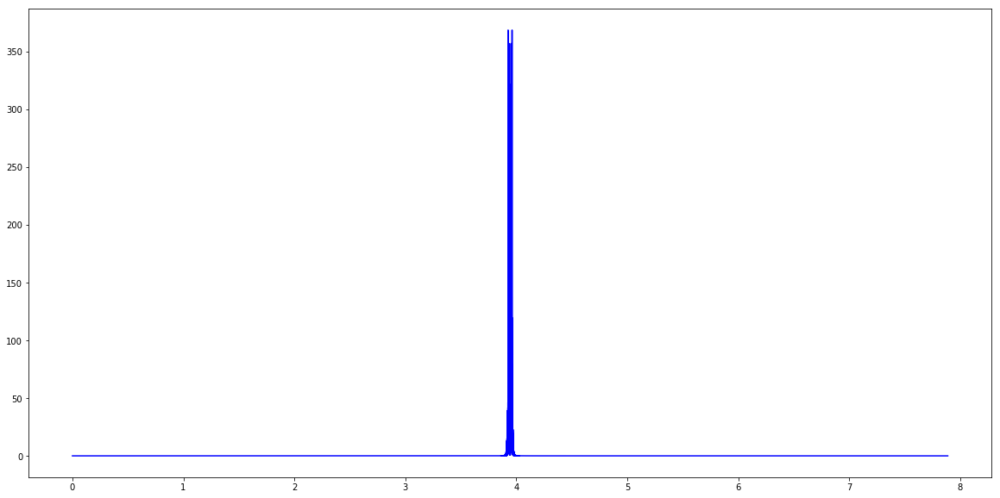

In [25]:
plt.figure(figsize=(20,10))
test = normal_group.filtered_signal_df.iloc[0]
plt.plot(test.dropna().index/(1.0*normal_group.samplerate), 
         np.abs(fftpack.fftshift(fftpack.fft(test.dropna().values))), 'b')

Calculate the "frequency" of the signals at different time points

In [26]:
a, b, c = normal_group.spectrogram(
    window_size=int(normal_group.heart_beat_rate_to_sampling_rate(80)/3),
    noverlap=0, #int(normal_group.heart_beat_rate_to_sampling_rate(80)/6),
)


Extract the columns for those binned data, we might want to do smoothing on bins ourselves

In [14]:
binned_data = normal_group.bin_signal(
    int(normal_group.heart_beat_rate_to_sampling_rate(80)/3),
    0, #int(normal_group.heart_beat_rate_to_sampling_rate(80)/6),
)

Load the results from the "Lub"/"Dub" testsets where they say where lub/dub occurs

In [15]:
# define location
# path = './set_a'
df = pd.read_csv(
    './set_a/Atraining_normal_seg.csv', 
    index_col=0
)# .applymap(lambda x: (x*1.0)/normal_group.samplerate)

files = list(df.index.map(lambda x: os.path.join('./set_a/', 'normal', 'normal__'+'.'.join(x.split('.')[:-1]) + '.wav')))
df.set_index(df.index.map(lambda x: 'normal__' + x.replace('.aif', '.wav')), inplace=True)

In [31]:
average_bin_data = normal_group.get_average_signal_in_bin(10000, 0)
S1_S2_binned_groups = normal_group.return_s1_s2_binned_data(df, 10000, 0)
s1_s2_data = normal_group.return_S1_S2_position(df, inplace=False)

** Step 3: Overlay heartbeat sounds provided by training sets **

In [32]:
test = normal_group.signal_df.iloc[0]

In [18]:
s1_s2_test_labels = s1_s2_data.loc[test.name]

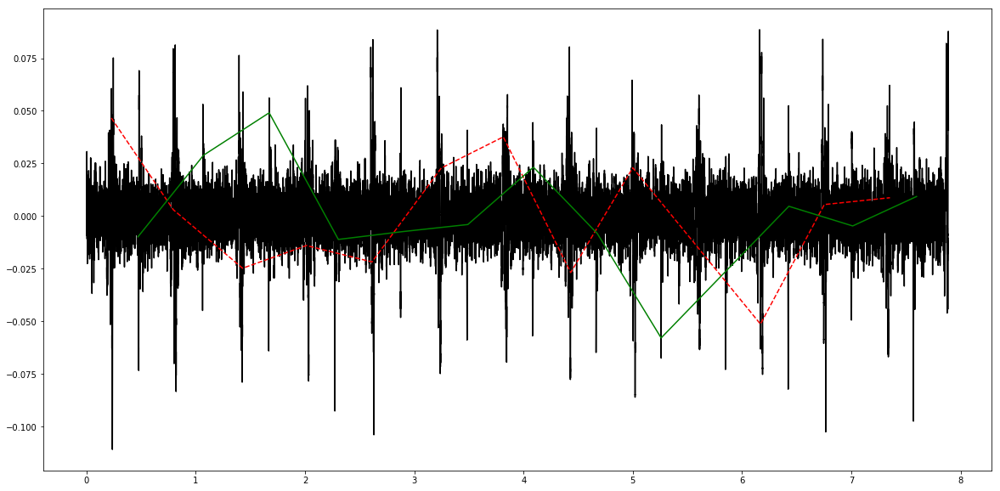

In [19]:
s1_x_vals = s1_s2_test_labels[s1_s2_test_labels=='S1'].index
s1_y_vals = test[s1_s2_test_labels=='S1'].values
s2_x_vals = s1_s2_test_labels[s1_s2_test_labels=='S2'].index
s2_y_vals = test[s1_s2_test_labels=='S2'].values

plt.figure(figsize=(20,10))

plt.plot(
    test.dropna().index/(1.0*normal_group.samplerate), test.dropna().values, 'k',
    s1_x_vals/(1.0*normal_group.samplerate), s1_y_vals, '--r',
    s2_x_vals/(1.0*normal_group.samplerate), s2_y_vals, '-g',

)

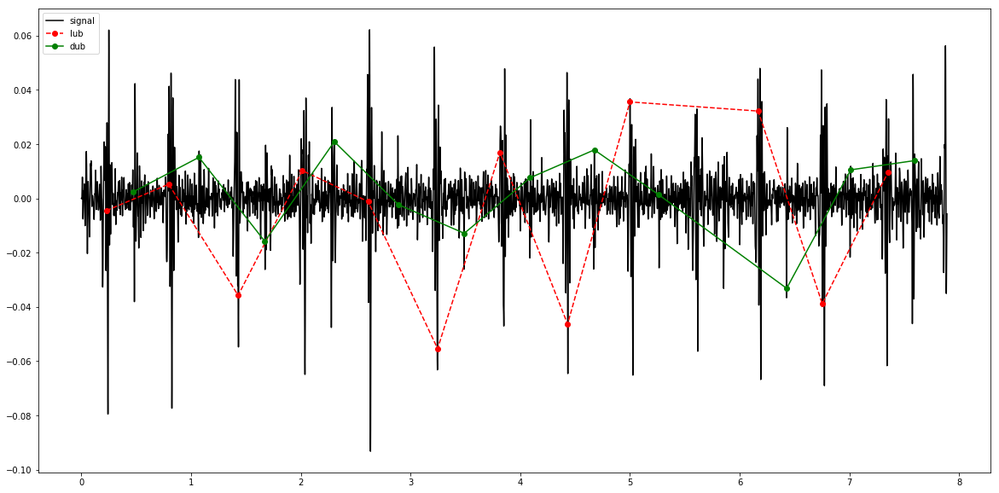

In [22]:
filtered_temp = normal_group.filtered_signal_df.loc[test.name]
s1_x_vals = s1_s2_test_labels[s1_s2_test_labels=='S1'].index
s1_y_vals = filtered_temp[s1_s2_test_labels=='S1'].values
s2_x_vals = s1_s2_test_labels[s1_s2_test_labels=='S2'].index
s2_y_vals = filtered_temp[s1_s2_test_labels=='S2'].values
plt.figure(figsize=(20,10))

plt.plot(
    filtered_temp.dropna().index/(1.0*normal_group.samplerate), filtered_temp.dropna().values, 'k', label='signal'
)
plt.plot(
    s1_x_vals/(1.0*normal_group.samplerate), s1_y_vals, 'o--r', label='lub'
)
plt.plot(
    s2_x_vals/(1.0*normal_group.samplerate), s2_y_vals, 'o-g', label='dub'

)
plt.legend()

** What does the binned data look like ? **

In [27]:
test_bin_data = average_bin_data.loc[test.name]
test_bin_data

5000.0     -0.000032
15000.0    -0.000132
25000.0    -0.000242
35000.0    -0.000416
45000.0     0.000153
55000.0     0.000230
65000.0    -0.000287
75000.0    -0.000327
85000.0    -0.001156
95000.0     0.000963
105000.0   -0.000664
115000.0   -0.000507
125000.0    0.000157
135000.0    0.000188
145000.0   -0.000074
155000.0    0.000007
165000.0   -0.000796
175000.0    0.000862
185000.0   -0.000179
195000.0   -0.000484
205000.0   -0.000143
215000.0   -0.000955
225000.0    0.000356
235000.0   -0.000558
245000.0   -0.000027
255000.0   -0.000668
265000.0   -0.000558
275000.0   -0.000402
285000.0   -0.000078
295000.0   -0.000444
305000.0    0.000130
315000.0   -0.000258
325000.0   -0.000221
335000.0   -0.000656
345000.0    0.000418
355000.0         NaN
365000.0         NaN
375000.0         NaN
385000.0         NaN
395000.0         NaN
Name: normal__201102081321.wav, dtype: float64

In [33]:
binned_s1_s2_test = S1_S2_binned_groups.loc[test.name]
binned_s1_s2_test

5000.0        
15000.0     S1
25000.0     S2
35000.0     S1
45000.0     S2
55000.0       
65000.0     S1
75000.0     S2
85000.0     S1
95000.0       
105000.0    S2
115000.0    S1
125000.0    S2
135000.0      
145000.0    S1
155000.0    S2
165000.0    S1
175000.0      
185000.0    S2
195000.0    S1
205000.0    S2
215000.0      
225000.0    S1
235000.0    S2
245000.0      
255000.0      
265000.0      
275000.0    S1
285000.0    S2
295000.0    S1
305000.0    S2
315000.0      
325000.0    S1
335000.0    S2
345000.0      
355000.0      
365000.0      
375000.0      
385000.0      
395000.0      
Name: normal__201102081321.wav, dtype: object

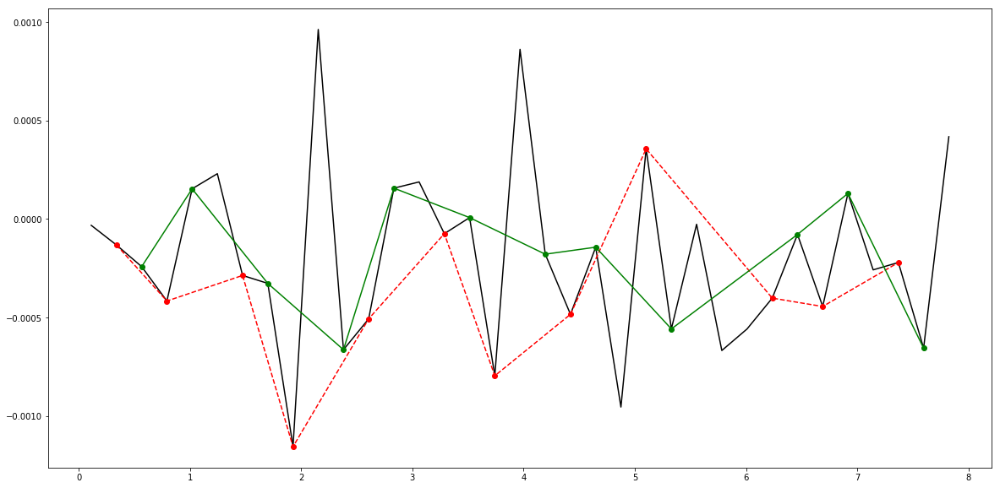

In [34]:
x_vals = test_bin_data.index
avg = test_bin_data.values

s1_x_vals = x_vals[binned_s1_s2_test=='S1']
s1_y_vals = avg[binned_s1_s2_test=='S1']
s2_x_vals = x_vals[binned_s1_s2_test=='S2']
s2_y_vals = avg[binned_s1_s2_test=='S2']
plt.figure(figsize=(20,10))

plt.plot(
    x_vals/(1.0*normal_group.samplerate), avg, 'k',
    s1_x_vals/(1.0*normal_group.samplerate), s1_y_vals, 'o--r',
    s2_x_vals/(1.0*normal_group.samplerate), s2_y_vals, 'o-g',

)

Looking at the bins using "max" amplitude in a bin

In [190]:
max_bin_data = normal_group.get_average_signal_in_bin(10000, 0, method='max')
test_max_bin_data = max_bin_data.loc[test.name]

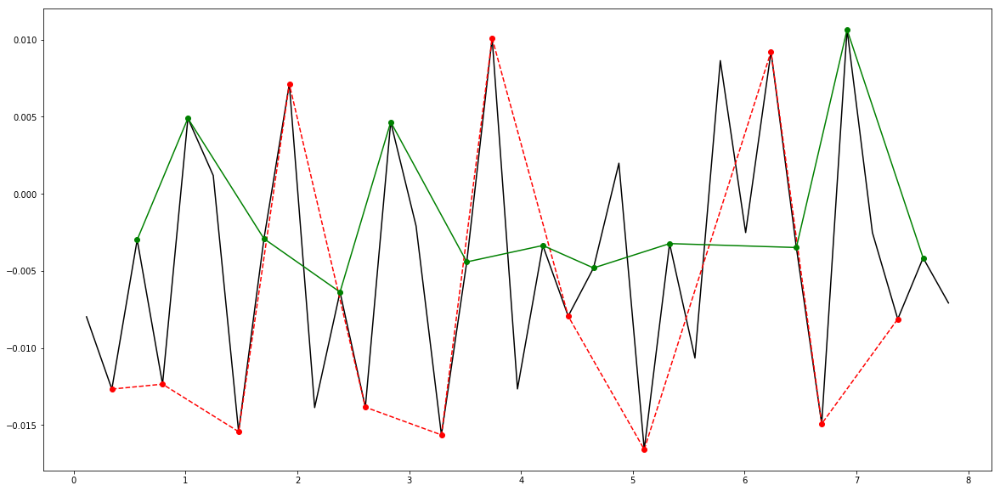

In [191]:
x_vals = test_max_bin_data.index
avg = test_max_bin_data.values

s1_x_vals = x_vals[binned_s1_s2_test=='S1']
s1_y_vals = avg[binned_s1_s2_test=='S1']
s2_x_vals = x_vals[binned_s1_s2_test=='S2']
s2_y_vals = avg[binned_s1_s2_test=='S2']
plt.figure(figsize=(20,10))

plt.plot(
    x_vals/(1.0*normal_group.samplerate), avg, 'k',
    s1_x_vals/(1.0*normal_group.samplerate), s1_y_vals, 'o--r',
    s2_x_vals/(1.0*normal_group.samplerate), s2_y_vals, 'o-g',

)

In [35]:
x_vals = np.array(binned_data.keys())
max_freq = c.iloc[0].index.max()/2
min_freq = c.iloc[0].index.min()
s1_x_vals = x_vals[s1_s2_binned=='S1']
s2_x_vals = x_vals[s1_s2_binned=='S2']

min1 = c.iloc[0].values[:, s1_s2_binned=='S1'].min(axis=1)
max1 = c.iloc[0].values[:, s1_s2_binned=='S1'].max(axis=1)

min2 = c.iloc[0].values[:, s1_s2_binned=='S2'].min(axis=1)
max2 = c.iloc[0].values[:, s1_s2_binned=='S2'].max(axis=1)

s1_y_values = c.iloc[0].values[:, s1_s2_binned=='S1'].mean(axis=1)
s1_y_values = (s1_y_values - min1)/(max1-min1)*(max_freq-min_freq) + min_freq

s2_y_values = c.iloc[0].values[:, s1_s2_binned=='S2'].mean(axis=1)
s2_y_values = (s2_y_values - min1)/(max1-min1)*(max_freq-min_freq) + min_freq


NameError: name 's1_s2_binned' is not defined

In [104]:
iplot(
    [
        go.Heatmap(x=c.iloc[0].columns, z=np.log(c.iloc[0].values)),
        go.Scatter(x=s1_x_vals, y=s1_y_values),
        go.Scatter(x=s2_x_vals, y=s2_y_values),
    ]
)

In [246]:
# ventricles closing -> lub
# atria closing -> dub
# r interval is distance of time between lub-dub. regular heartbeats have constant r-interval

### Some abnormal heartbeats ###

** Heart murmurs **

In [39]:

files = [
    os.path.join('./set_a/', 'murmur', '.'.join(x.split('.')[:-1]) + '.wav') 
    for x in os.listdir('./set_a/murmur/')
]
# create instance
murmur_group = heart_signal(files=files)
# read in wav data
murmur_group.create_df()
# make sure there are no nan values before the end
# because this is empty there are no null values in the middle of the wav files
murmur_group.identify_null_values()


Files look good (no NaN in the middle)


Index([], dtype='object', name=u'basename')

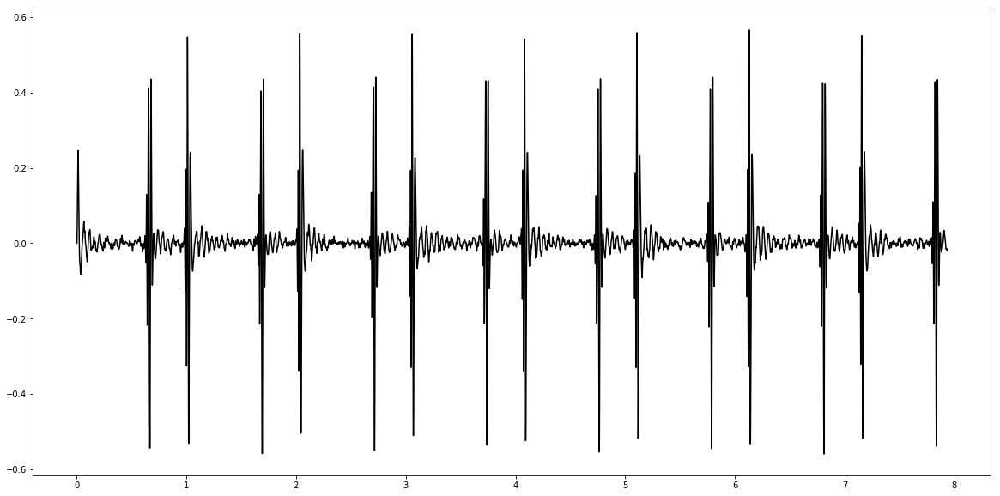

In [41]:
murmur_group.low_pass_filter(100, inplace=True)
plt.figure(figsize=(20,10))
test = murmur_group.filtered_signal_df.iloc[1]
plt.plot(test.dropna().index/(1.0*murmur_group.samplerate), test.dropna().values, 'k')

** Extraheart sound **

In [43]:

files = [
    os.path.join('./set_a/', 'extrahls', '.'.join(x.split('.')[:-1]) + '.wav') 
    for x in os.listdir('./set_a/extrahls/')
]
# create instance
extrahls_group = heart_signal(files=files)
# read in wav data
extrahls_group.create_df()
# make sure there are no nan values before the end
# because this is empty there are no null values in the middle of the wav files
extrahls_group.identify_null_values()


Files look good (no NaN in the middle)


Index([], dtype='object', name=u'basename')

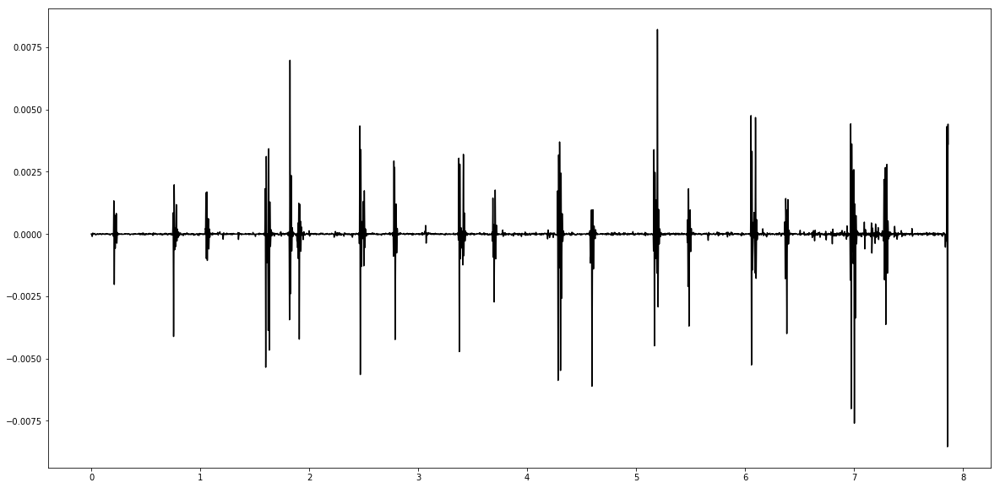

In [44]:
extrahls_group.low_pass_filter(100, inplace=True)
plt.figure(figsize=(20,10))
test = extrahls_group.filtered_signal_df.iloc[1]
plt.plot(test.dropna().index/(1.0*extrahls_group.samplerate), test.dropna().values, 'k')

** Extrasystole **

In [46]:

files = [
    os.path.join('./set_b/', 'extrastole', '.'.join(x.split('.')[:-1]) + '.wav') 
    for x in os.listdir('./set_b/extrastole/')
]
# create instance
extrastole_group = heart_signal(files=files)
# read in wav data
extrastole_group.create_df()
# make sure there are no nan values before the end
# because this is empty there are no null values in the middle of the wav files
extrastole_group.identify_null_values()


Files look good (no NaN in the middle)


Index([], dtype='object', name=u'basename')

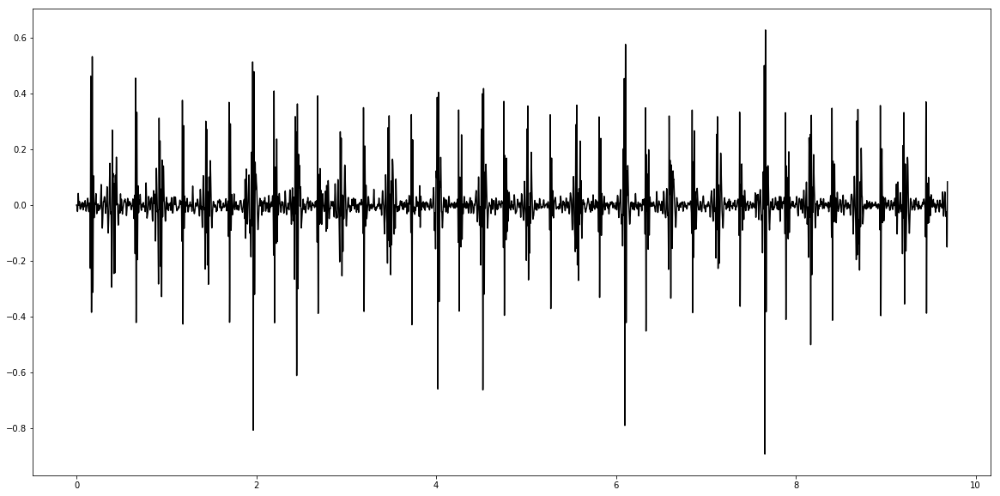

In [50]:
extrastole_group.low_pass_filter(100, inplace=True)
plt.figure(figsize=(20,10))
test = extrastole_group.filtered_signal_df.iloc[1]
plt.plot(test.dropna().index/(1.0*extrastole_group.samplerate), test.dropna().values, 'k')